In [16]:
import sys
import os
sys.path.append("../")
from src.data.session import Session
import src.features.features_utils as utils
import src.visualisation.plot_data as myplot
import pandas as pd

In [2]:
%load_ext autoreload
%autoreload 2

# Load data

In [3]:
project_dir = "/Users/anacarolinabotturabarros/PycharmProjects/RSCMINHD/data"
animal = 'cohoHDC1_mB1'
session = "2023_03_10/12_51_18"

my_session = Session(project_dir,session,animal)
my_session.load_all_data()
my_session.calculate_dF_F()
my_session.normalise_minmax()

# Work with head orientation data

In [4]:
utils.get_euler_coords(my_session)
my_session.ho_data.keys()

Index(['Time Stamp (ms)', 'qw', 'qx', 'qy', 'qz', 'frame', 'roll_x', 'pitch_y',
       'yaw_z'],
      dtype='object')

In [5]:
utils.bin_ho(my_session,['yaw_z'],[6])
my_session.ho_data.keys()

Index(['Time Stamp (ms)', 'qw', 'qx', 'qy', 'qz', 'frame', 'roll_x', 'pitch_y',
       'yaw_z', 'binned_yaw_z'],
      dtype='object')

In [6]:
intervals = utils.get_intervals(my_session.ho_data, 'binned_yaw_z')

In [7]:
dir_tunning = utils.get_dir_tunning(my_session.img_data,intervals)

calculating area under the curve for intervals...
Done!
Calculating interval lengths...
Done!


In [8]:
spath = os.path.join(project_dir,'processed', animal, session)
if not os.path.exists(spath):
    os.makedirs(spath)
dir_tunning.to_csv(os.path.join(spath,'auc_dir_tunning.csv'))

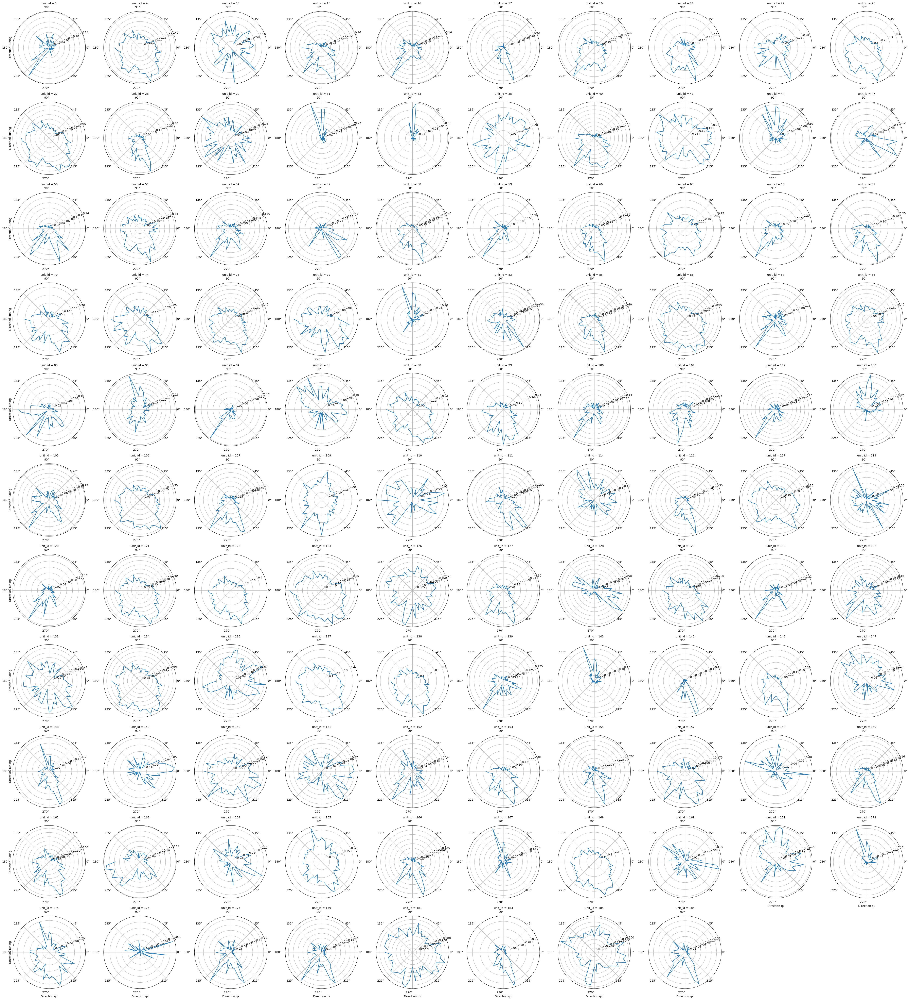

In [9]:
g = myplot.plot_dir_tunning(dir_tunning)

In [10]:
spath = os.path.join(project_dir[:-4],"reports/figures", animal, session)
if not os.path.exists(spath):
    os.makedirs(spath)
g.savefig(os.path.join(spath,"all_ROIs.png"))

## Checking direction tunning on first and second halves

In [11]:
half = int(my_session.ho_data.shape[0]/2)
intervals_1of2 = utils.get_intervals(my_session.ho_data.loc[:half-1,:],'binned_yaw_z')
intervals_2of2 = utils.get_intervals(my_session.ho_data.loc[half:,:],'binned_yaw_z')

In [12]:
dir_tunning_1of2 = utils.get_dir_tunning(
    my_session.img_data[my_session.img_data.frame < half],intervals_1of2)
dir_tunning_2of2 = utils.get_dir_tunning(
    my_session.img_data[my_session.img_data.frame >= half],intervals_2of2)

calculating area under the curve for intervals...
Done!
Calculating interval lengths...
Done!
calculating area under the curve for intervals...
Done!
Calculating interval lengths...
Done!


       unit_id  half          variable     value
0            1     1  (-180.0, -174.0]  0.001689
1            4     1  (-180.0, -174.0]  0.217620
2           13     1  (-180.0, -174.0]  0.028319
3           15     1  (-180.0, -174.0]  0.031241
4           16     1  (-180.0, -174.0]  0.010174
...        ...   ...               ...       ...
12955      179     2    (174.0, 180.0]  0.046036
12956      181     2    (174.0, 180.0]  0.154400
12957      183     2    (174.0, 180.0]  0.062844
12958      184     2    (174.0, 180.0]  0.071160
12959      185     2    (174.0, 180.0]  0.058111

[12960 rows x 4 columns]


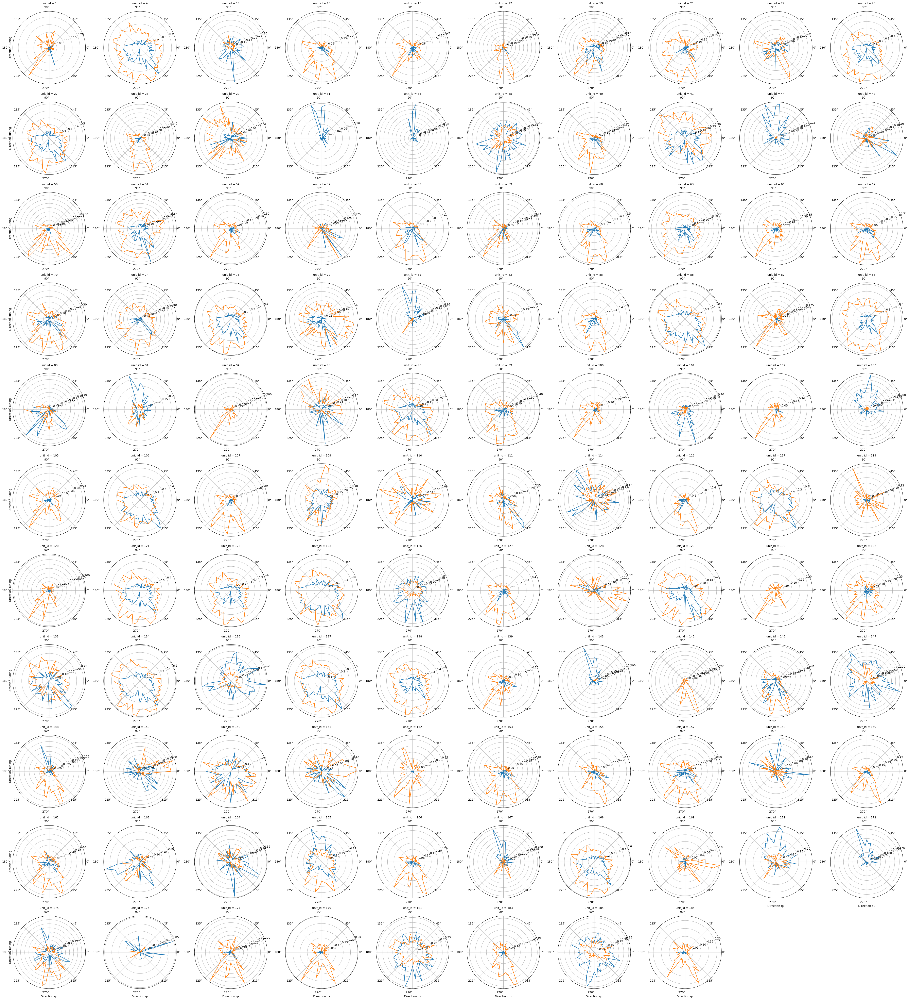

In [23]:
dir_tunning_1of2.loc[:,'half'] = 1
dir_tunning_2of2.loc[:,'half'] = 2
df = pd.concat([dir_tunning_1of2, dir_tunning_2of2])
g = myplot.plot_dir_tunning(df, hue='half', id_vars = ['unit_id', 'half'])


In [24]:

spath = os.path.join(project_dir[:-4],"reports/figures", animal, session)
if not os.path.exists(spath):
    os.makedirs(spath)
g.savefig(os.path.join(spath,"all_ROIs_sessionHalves.png"))